In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Setting up Darknet


In [ ]:
%cd /content/drive/MyDrive/yolo/darknet-master
%ls

/content/drive/.shortcut-targets-by-id/1Nh7EjUrCqK4qFlJCnP_FZ7DzvB1EWt5z/yolo/darknet-master
 3rdparty/                        ngrok-stable-linux-amd64.zip.2
 anchors.txt                      ngrok-stable-linux-amd64.zip.3
 backup/                          ngrok-stable-linux-amd64.zip.4
 bad.list                         ngrok-stable-linux-amd64.zip.5
 build/                           ngrok-stable-linux-amd64.zip.6
 build.ps1                        ngrok-stable-linux-amd64.zip.7
 cfg/                             ngrok-stable-linux-amd64.zip.8
 chart.png                        ngrok-stable-linux-amd64.zip.9
 chart_yolo-obj.png               obj/
 cmake/                           obj.data
 CMakeLists.txt                   obj.names
 counters_per_class.txt           predictions.jpg
 darknet                          README.md
 darknet53.conv.74                result.json
 DarknetConfig.cmake.in           results/
 darknet_images.py                result.txt
 darknet.py                      

### MakeFile

In [ ]:
%cd /content/drive/MyDrive/yolo/darknet-master/
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!make
!chmod +x ./darknet

/content/drive/MyDrive/yolo/darknet-master
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:946:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1147:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_o

## Train preparation


#### Setting up the parameters

We have to set up some parameters before we proceed with the training.

**Height and width**

DepthAI supports Yolo with non-square input sizes. You can set a custom height and width, as long as they are both divisible by *32*. For example, our images have *16 : 10* aspect ratio and they are *1920 x 1200* pixels wide and high. As we want to keep the aspect ratio, but use a smaller input for faster inference, we set the `yolo_height = 320` and `yolo_width = 512`. Both values, *320* and *512* are divisible by *32*.

**Other parameters**

We set other parameters according to [this tutorial](https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects). Those settings should suffice. If you have any questions, feel free to ask them on our Discord. :)

Note that in our case we set `max_batch = 2000 * 1`, if you are training on one or two classes only, you should set it to at least `6000`.

 #### obj.names

In [ ]:
labels_path = '/content/drive/MyDrive/yolo/darknet-master/obj.names'

# make a list of your labels
# labels = ['car']
labels = ['Locked', 'Unlocked']

with open(labels_path, 'w') as f:
    f.write('\n'.join(labels))

#check that the labels file is correct
!cat $labels_path

Locked
Unlocked

#### obj.data

In [ ]:
import re
objdata  = '/content/drive/MyDrive/yolo/darknet-master/obj.data'


#the number of classes is equal to the number of labels
num_classes = len(labels)

with open(objdata, 'w') as f:
  f.write(f"classes = {num_classes}\n")
  f.write(f"train = train.txt\n")
  f.write(f"valid = Test.txt\n")
  f.write(f"names = obj.names\n")
  f.write(f"backup = backup/")

!cat $objdata

classes = 2
train = train.txt
valid = Test.txt
names = obj.names
backup = backup/

#### parameters of config
It's how many mini batches you split your batch in.  
`Batch=64 -> loading 64 images for this "iteration"`.
`Subdivision=8 -> Split batch into 8 "mini-batches"`   
So 64/8 = 8 images per "minibatch" and this get sent to the gpu for process.
That will be repeated 8 times until the batch is completed and a new itereation will start with 64 new images.

*When batching you are averaging over more images the intend is not only to speed up the training process but also to generalise the training more.* -The more you know 🧠

If your GPU have enough memory you can reduce the subdivision to load more images into the gpu to process at the same time.  
Total of images in train set :  723 images
CL :  
dataset = 723 samples = 1 epoch  
batch = 64  
subdivisions = mini-batches = 16  
1 epoch = 12 iterations = 723/64  
1 iteration = 16 mini-batches = 1 batch  
mini-batch size = 64/16 = 4 samples  

In [ ]:
# must be divisible by 32
yolo_height = 320
yolo_width = 512

# set the number of max_batches - min 2000 per class:
max_batch = num_classes * 2000
# calculate the 2 steps values:
step1 = 0.8 * max_batch
step2 = 0.9 * max_batch

# we also need to adjust the number of classes and a parameter called filter size
# that are both is inside the model structure

# num_classes = len(labels)
num_filters = (num_classes + 5) * 3

batch = 64
subdivisions = 16

#### yolo_obj.cfg

In [ ]:
cfg_file = '/content/drive/MyDrive/yolo/darknet-master/cfg/yolo-obj.cfg'

In [ ]:
with open(cfg_file) as f:
    s = f.read()
# (re.sub('[a-z]*@', 'ABC@', s))
s = re.sub('max_batches = \d*','max_batches = '+str(max_batch),s)
s = re.sub('steps=\d*,\d*','steps='+"{:.0f}".format(step1)+','+"{:.0f}".format(step2),s)
s = re.sub('classes=\d*','classes='+str(num_classes),s)
s = re.sub('pad=1\nfilters=\d*','pad=1\nfilters='+"{:.0f}".format(num_filters),s)
s = re.sub('batch=\d*', 'batch='+str(batch), s)
s = re.sub('subdivisions=\d*', 'subdivisions='+str(subdivisions), s)
s = re.sub('height=\d*', 'height='+str(yolo_height), s)
s = re.sub('width=\d*', 'width='+str(yolo_width), s)
s = re.sub('angle=\d*', 'angle='+str(0), s)

# pad=1\nfilters=\d\d
# s = re.sub('CUDNN=0','CUDNN=1',s)
# s = re.sub('OPENCV=0','OPENCV=1',s)

with open(cfg_file, 'w') as f:
  # s = re.sub('GPU=0','GPU=1',s)
  f.write(s)



In [ ]:
!head -n 24 $cfg_file

[net]
# Testing
#batch=64
#subdivisions=16
# Training
batch=64
subdivisions=16
width=512
height=320
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=1000
max_batches = 4000
policy=steps
steps=3800
scales=.1



## Training

### mAP

In [ ]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip

--2022-07-07 08:15:33--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.202.168.65, 54.161.241.46, 18.205.222.128, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.202.168.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13832437 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip.9’

ngrok-stable-linux- 100%[===================>]  13.19M  31.9MB/s    in 0.4s    

2022-07-07 08:15:33 (31.9 MB/s) - ‘ngrok-stable-linux-amd64.zip.9’ saved [13832437/13832437]



In [ ]:
!unzip ngrok-stable-linux-amd64.zip

Archive:  ngrok-stable-linux-amd64.zip
replace ngrok? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: ngrok                   


In [ ]:
get_ipython().system_raw('./ngrok http 8090 &')

In [ ]:
!curl -s http://localhost:4040/api/tunnels | python3 -c "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

https://3889-34-136-179-142.ngrok.io


In [ ]:
!./darknet detector train obj.data cfg/yolo-obj.cfg  darknet53.conv.74 >> yolov3.log -dont_show -mjpeg_port 8090 -map

Streaming output truncated to the last 5000 lines.
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.770132), count: 4, class_loss = 0.035283, iou_loss = 0.264043, total_loss = 0.299326 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
 total_bbox = 125745, rewritten_bbox = 0.000000 % 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.704723), count: 4, class_loss = 0.217602, iou_loss = 0.208233, total_loss = 0.425834 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.000000), count: 1, class_loss = 0.000088, iou_loss = 0.000000, total_loss = 0.000088 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.0

# Testing

In [ ]:
with open('/content/drive/MyDrive/yolo/darknet-master/Test.txt', 'r') as f:
    myTest = [line.strip() for line in f]

In [ ]:
print(myTest)

['Test/eUnlocked7.jpg', 'Test/eUnlocked13.jpg', 'Test/eUnlocked10.jpg', 'Test/eLocked_6.jpg', 'Test/eLocked_7.jpg', 'Test/eLocked_8.jpg', 'Test/eUnlocked9.jpg', 'Test/eLocked_0.jpg', 'Test/rUnlocked12.jpg', 'Test/ee.jpg', 'Test/e.jpg', 'Test/eLocked_3.jpg', 'Test/eUnlocked6.jpg', 'Test/eLocked_5.jpg', 'Test/eLocked_4.jpg', 'Test/eLocked_2.jpg', 'Test/eLocked_9.jpg', 'Test/eLocked_1.jpg', 'Test/eeUnlocked11.jpg', 'Test/r.jpg', 'Test/eLocked_13.jpg', 'Test/eLocked_11.jpg', 'Test/eLocked_10.jpg', 'Test/eLocked_12.jpg', 'Test/eLocked_14.jpg', 'Test/eUnlocked4.jpg', 'Test/eUnlocked2.jpg', 'Test/z.jpg', 'Test/eUnlocked1.jpg', 'Test/(Unlocked0.jpg']


In [ ]:
cfg_file = '/content/drive/MyDrive/yolo/darknet-master/cfg/yolo-obj.cfg'
weights_best = '/content/drive/MyDrive/yolo/darknet-master/backup/yolo-obj_best.weights'

In [ ]:
import os
import shutil, sys

for c in range(len(myTest)):
  test_im = myTest[c]
  new_name = myTest[c].split('/')[-1]
  #new_name ='\(\\'.join(new_name.split('(',))
  #new_name ='\)\\'.join(new_name.split(')',))
  test_im ='\(\\'.join(test_im.split('('))
  test_im ='\)\\'.join(test_im.split(')'))
  !./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best $test_im -ext_output
  print('__________________')
  print('Done predicting !')

  test_im = ''.join(test_im.split('\\'))
  src = '/content/drive/MyDrive/yolo/darknet-master/predictions.jpg'
  file_name = '/content/drive/MyDrive/yolo/darknet-master'


  new_name = test_im.split('/')[-1]
  new_src = os.path.join(file_name,new_name)

  file_dst = ' /content/drive/MyDrive/yolo/darknet-master/results'
  dst = os.path.join(file_dst,new_name)
  print('')

  os.rename(src, new_src)
  print(f'renaming {src} ========> {new_src}')

  shutil.move(new_src, dst)
  print(f'moving from {new_src} =========> {dst}\n')
  if c == 5:
    break


In [ ]:
c = 0
import os
import subprocess

for test_im in myTest :
  c += 1
  src = '/content/drive/MyDrive/yolo/darknet-master/predictions.jpg'
  file_name = '/content/drive/MyDrive/yolo/darknet-master/darknet/Test'
  new_name = test_im.split('/')[-1]
  new_src = os.path.join(file_name,new_name)
  file_dst = '/content/drive/MyDrive/yolo/darknet-master/results'
  dst = os.path.join(file_dst,new_name)
  cmd_stuff = test_im +' -ext_output'
  cmd_first_part = './darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '
  cmd = cmd_first_part + cmd_stuff
  print(cmd)

  print('\n')


  #os.rename(src, new_src)
  print(f'renaming {src} ========> {new_src}')

  #shutil.move(new_src, dst)
  print(f'moving from {new_src} =========> {dst}')

  print('done lmao !')
  if c == 5 :
    break

./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best Test/eUnlocked7.jpg -ext_output


renaming /content/drive/MyDrive/yolo/darknet-master/predictions.jpg ========> /content/drive/MyDrive/yolo/darknet-master/darknet/Test/eUnlocked7.jpg
moving from /content/drive/MyDrive/yolo/darknet-master/darknet/Test/eUnlocked7.jpg =========> /content/drive/MyDrive/yolo/darknet-master/results/eUnlocked7.jpg
done lmao !
./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best Test/eUnlocked13.jpg -ext_output


renaming /content/drive/MyDrive/yolo/darknet-master/predictions.jpg ========> /content/drive/MyDrive/yolo/darknet-master/darknet/Test/eUnlocked13.jpg
moving from /content/drive/MyDrive/yolo/darknet-master/darknet/Test/eUnlocked13.jpg =========> /content/drive/MyDrive/yolo/darknet-master/results/eUnlocked13.jpg
done lmao !
./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/rUnlocked12.jpg' -ext_output


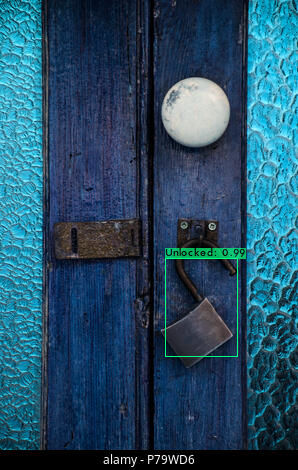

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked9.jpg' -ext_output


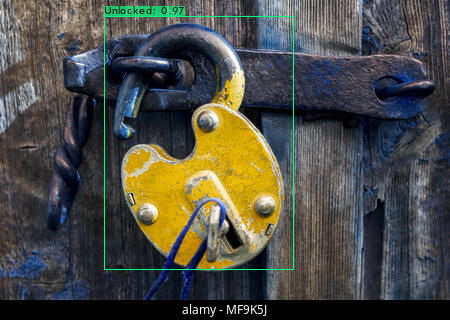

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_6.jpg' -ext_output# 1 __ 9

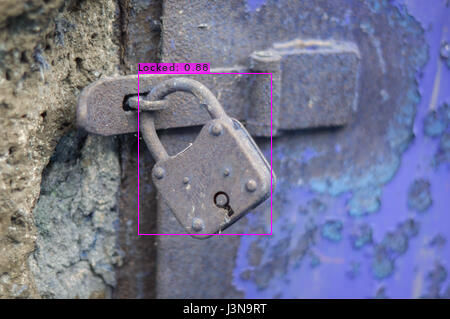

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_1.jpg' -ext_output# 1 __ 9

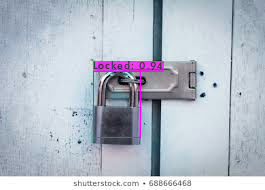

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_2.jpg' -ext_output# 1 __ 9

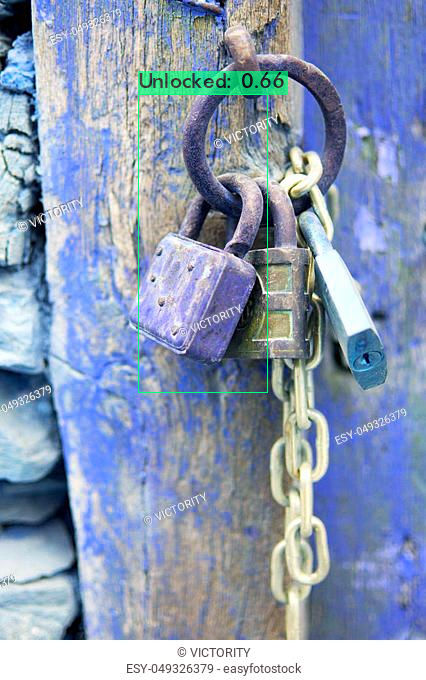

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_3.jpg' -ext_output# 1 __ 9

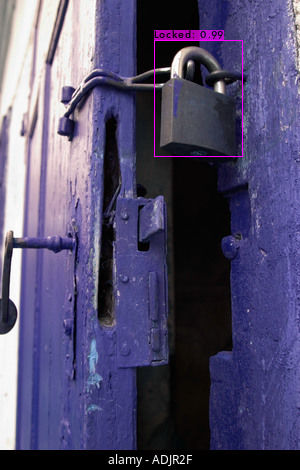

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_4.jpg' -ext_output# 1 __ 9

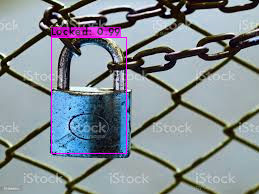

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_5.jpg' -ext_output# 1 __ 9

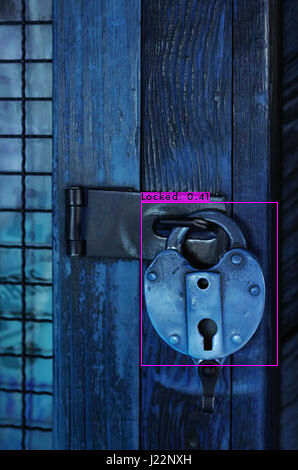

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eLocked_9.jpg' -ext_output# 1 __ 9

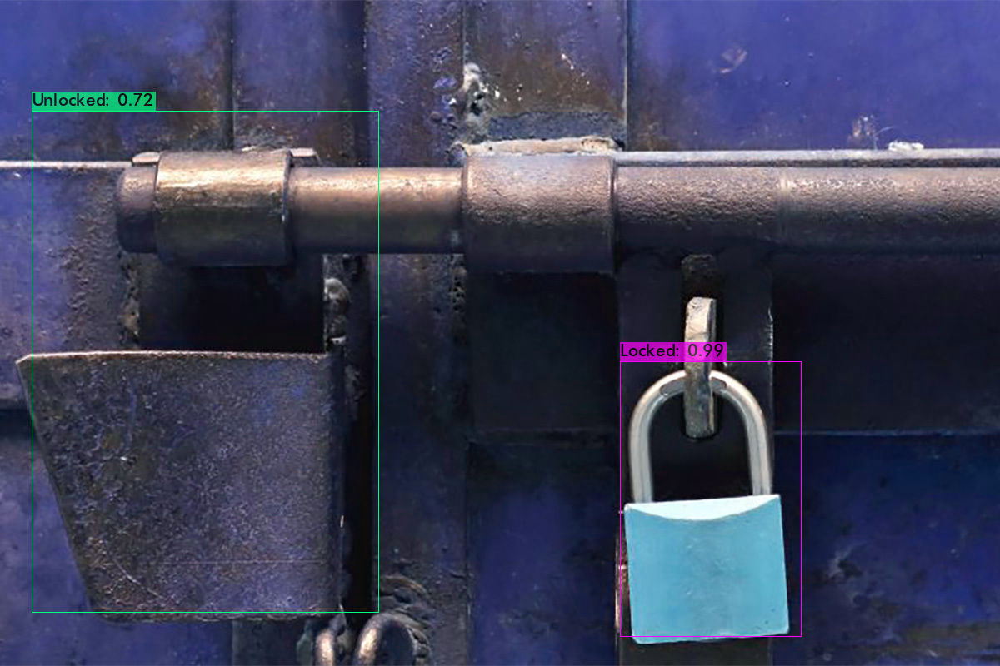

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked10.jpg' -ext_output


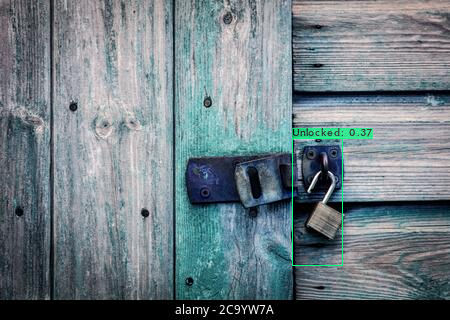

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked7.jpg' -ext_output


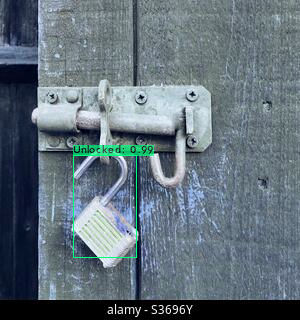

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked13.jpg' -ext_output


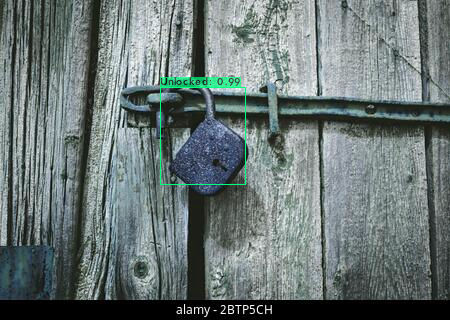

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/z.jpg' -ext_output


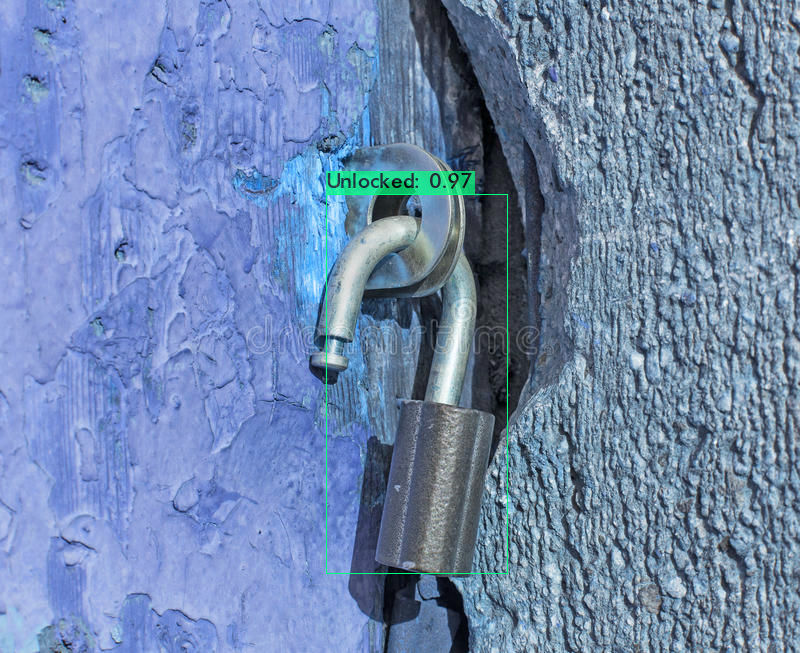

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked6.jpg' -ext_output


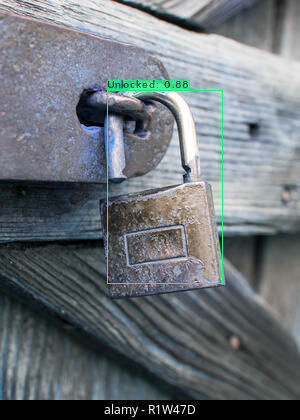

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked4.jpg' -ext_output


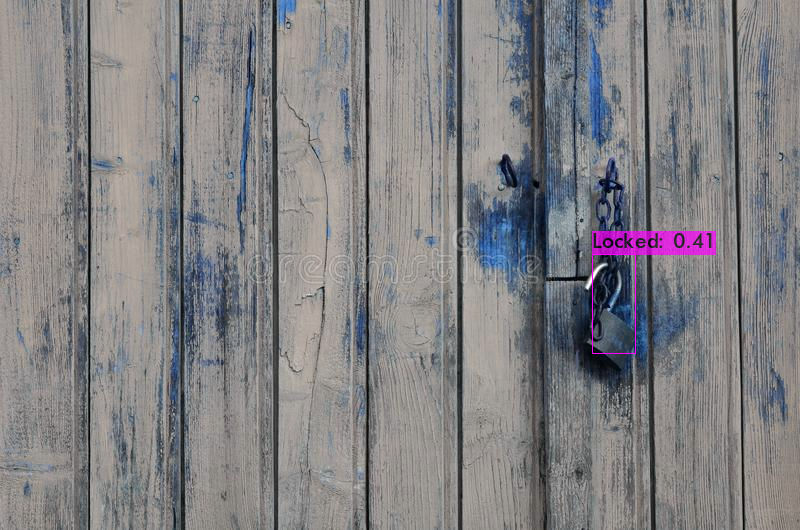

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked2.jpg' -ext_output


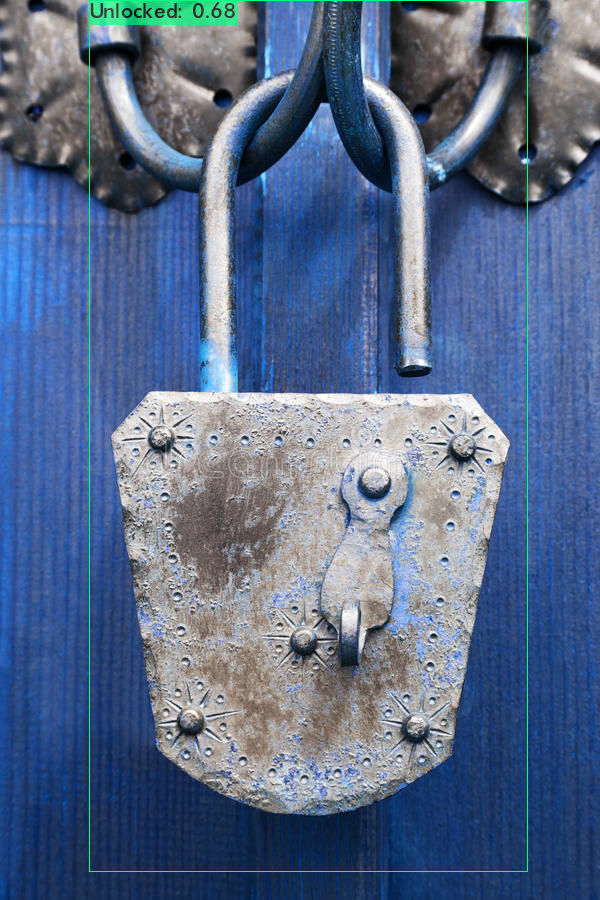

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

In [ ]:
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best '/content/drive/MyDrive/yolo/darknet-master/Test/eUnlocked1.jpg' -ext_output


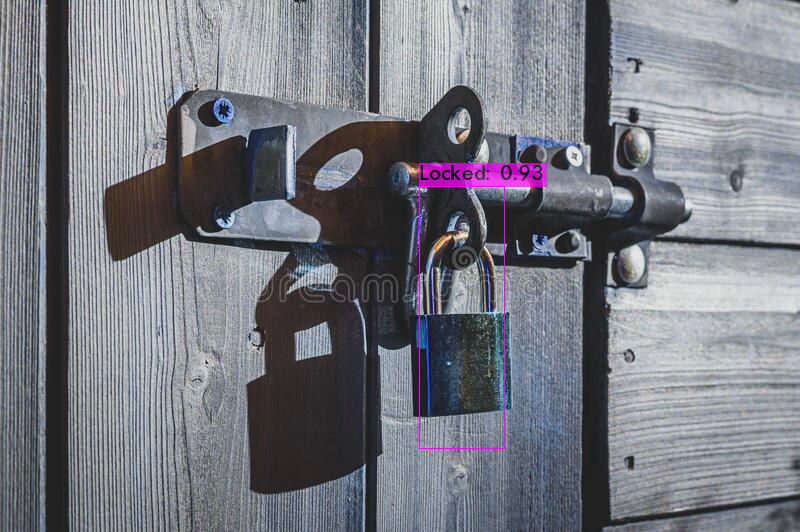

In [ ]:
import cv2
from skimage.io import imread
from google.colab.patches import cv2_imshow
img = imread("/content/drive/MyDrive/yolo/darknet-master/predictions.jpg")
cv2_imshow(img)

### Loading all

In [ ]:
#!./darknet detector test   $cfg_file  $weights_best <  -dont_show -ext_output -out result.json
!./darknet detector test /content/drive/MyDrive/yolo/darknet-master/obj.data  $cfg_file  $weights_best -dont_show -ext_output < /content/drive/MyDrive/yolo/darknet-master/Test.txt > result.txt

In [ ]:
%cd /content/drive/MyDrive/yolo/darknet-master
!./darknet detector test obj.data  $cfg_file  $weights_best -dont_show -ext_output -out result.json < /content/drive/MyDrive/yolo/darknet-master/Test.txt

In [ ]:
!chmod +x ./darknet

## Testing on a Video

In [ ]:
!./darknet detector demo obj.data cfg/yolo-obj.cfg backup/yolo-obj_best.weights -ext_output test.mp4 -dont_show


Streaming output truncated to the last 5000 lines.
Objects:

Unlocked: 37% 	(left_x:  183   top_y:    9   width:  120   height:  157)
Locked: 30% 	(left_x:  178   top_y:    1   width:  114   height:  175)

FPS:82.8 	 AVG_FPS:85.2
Objects:

Unlocked: 35% 	(left_x:  183   top_y:   10   width:  119   height:  155)
Locked: 35% 	(left_x:  169   top_y:   10   width:  131   height:  184)

FPS:82.0 	 AVG_FPS:85.2
Objects:

Unlocked: 28% 	(left_x:  185   top_y:   10   width:  117   height:  157)
Locked: 42% 	(left_x:  165   top_y:    8   width:  138   height:  191)

FPS:83.0 	 AVG_FPS:85.2
Objects:

Unlocked: 33% 	(left_x:  187   top_y:    8   width:  114   height:  162)
Locked: 42% 	(left_x:  171   top_y:   30   width:  143   height:  143)

FPS:83.9 	 AVG_FPS:85.2
Objects:

Unlocked: 31% 	(left_x:  188   top_y:    7   width:  114   height:  165)
Locked: 62% 	(left_x:  168   top_y:   31   width:  151   height:  142)

FPS:84.7 	 AVG_FPS:85.2
Objects:

Unlocked: 37% 	(left_x:  190   top_y:    7  